# Finetuned SAM2 Inference Tasks

## Image Segmentation Inference

In [1]:
import numpy as np
import torch
import cv2
import os
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from pathlib import Path
from PIL import Image

In [2]:
# - unpack test tif dataset to png dataset
data_dir= Path("./snemi/" )
raw_image_dir = data_dir / 'image'
raw_image_tif_path = raw_image_dir / os.listdir(raw_image_dir)[1]
save_dir = data_dir / 'image_test_pngs'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

with Image.open(raw_image_tif_path) as img:
    for i in range(img.n_frames):
        temp_filename = f'image{i:04d}.png'
        if os.path.exists(save_dir / temp_filename):
            continue
        img.seek(i)
        img.save(save_dir / temp_filename)

In [3]:
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()
image_path = save_dir / 'image0000.png'

img = cv2.imread(str(image_path))


In [4]:
# - randomly get 30 points (we best use bounding box to do this task)
num_samples = 30
def get_points(mask,num_points): # Sample points inside the input mask
        points=[]
        for i in range(num_points):
            coords = np.argwhere(mask > 0)
            yx = np.array(coords[np.random.randint(len(coords))])
            points.append([[yx[1], yx[0]]])
        return np.array(points)
input_points = get_points(img,num_samples)

In [5]:
# - load fine-tuning parameters
sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "./sam2_hiera_l.yaml"
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device='cpu')
predictor = SAM2ImagePredictor(sam2_model)
predictor.model.load_state_dict(torch.load("large_model.torch"))

<All keys matched successfully>

In [6]:
with torch.no_grad(): # prevent the net from caclulate gradient (more efficient inference)
        predictor.set_image(img) # image encoder
        masks, scores, logits = predictor.predict(  # prompt encoder + mask decoder
            point_coords=input_points,
            point_labels=np.ones([input_points.shape[0],1])
        )

In [7]:
# - sort masks and their predicted scores
masks=masks[:,0].astype(bool)
shorted_masks = masks[np.argsort(scores[:,0])][::-1].astype(bool)

In [8]:
# - create an empty segmentation map
seg_map = np.zeros_like(shorted_masks[0],dtype=np.uint8)
occupancy_mask = np.zeros_like(shorted_masks[0],dtype=bool)

In [9]:
# - add the masks one by one from high to low score
for i in range(shorted_masks.shape[0]):
    mask = shorted_masks[i]
    if (mask*occupancy_mask).sum()/mask.sum()>0.15: continue 
    mask[occupancy_mask]=0
    seg_map[mask]=i+1
    occupancy_mask[mask]=1

In [10]:
rgb_image = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
for id_class in range(1,seg_map.max()+1):
    rgb_image[seg_map == id_class] = [np.random.randint(255), np.random.randint(255), np.random.randint(255)]

In [11]:
# cv2.imshow("annotation",rgb_image)
# cv2.imshow("mix",(rgb_image/2+img/2).astype(np.uint8))
# cv2.imshow("image",img)
# cv2.waitKey()

### Automatically Generate Masks

In [ ]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [ ]:
np.random.seed(3)

def show_anns(anns, borders=True):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.5]])
        img[m] = color_mask 
        if borders:
            import cv2
            contours, _ = cv2.findContours(m.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
            # Try to smooth contours
            contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
            cv2.drawContours(img, contours, -1, (0, 0, 1, 0.4), thickness=1) 

    ax.imshow(img)

In [ ]:
# - experiment with trained image
train_image_path = data_dir / 'image_pngs' / 'image0000.png'
train_image_sample = Image.open(train_image_path)
train_image = np.array(train_image_sample.convert("RGB"))

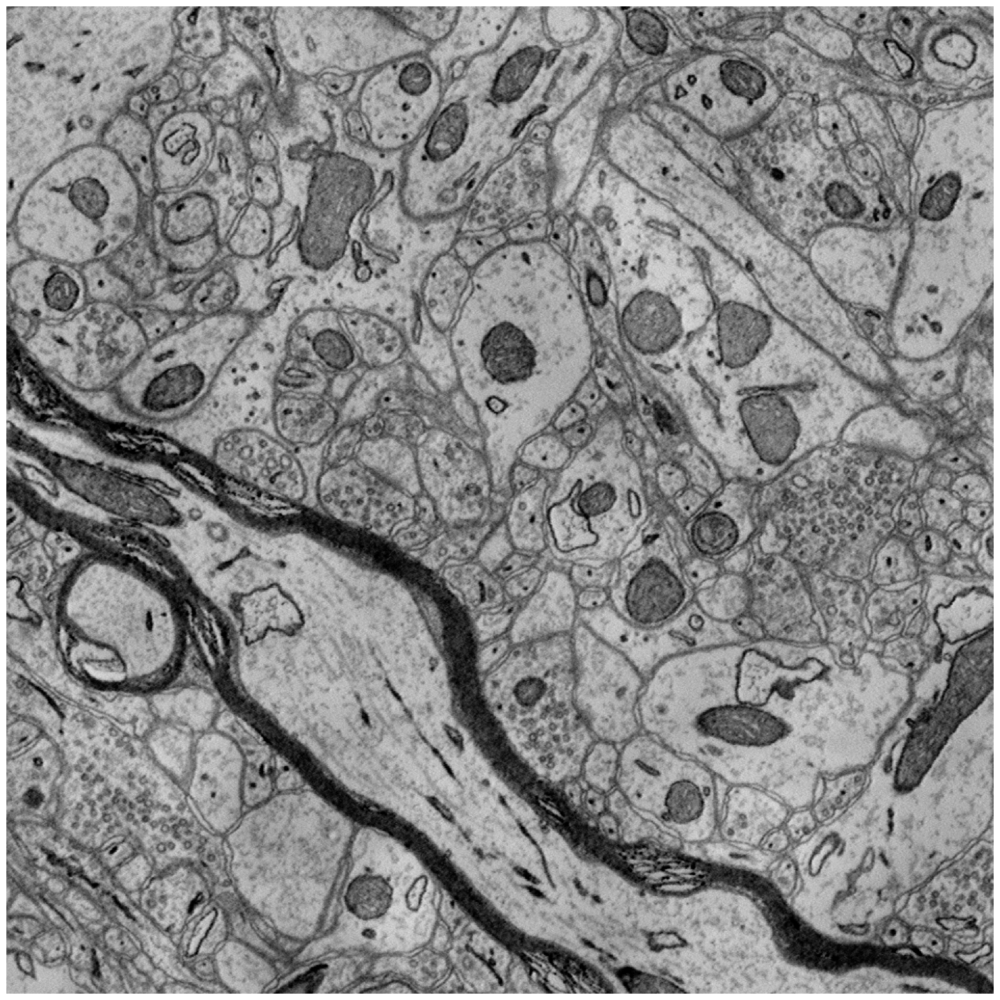

In [ ]:
# - experiment with test image
image_sample = Image.open(image_path)
image = np.array(image_sample.convert("RGB"))
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.axis('off')
plt.show()


In [ ]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

sam2_checkpoint = "./sam2_hiera_large.pt"
model_cfg = "./sam2_hiera_l.yaml"

sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(sam2)

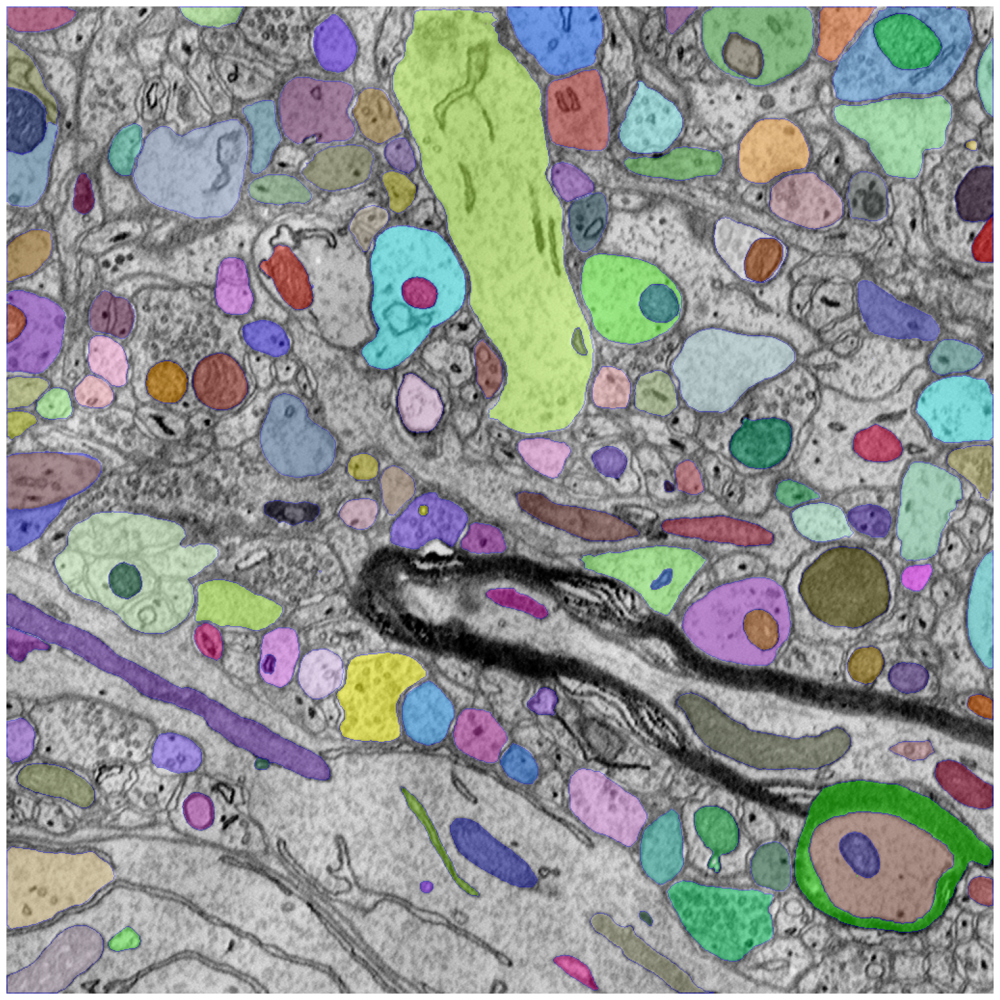

In [ ]:
# - default large model + train image
train_masks = mask_generator.generate(train_image)
plt.figure(figsize=(20, 20))
plt.imshow(train_image)
show_anns(train_masks)
plt.axis('off')
plt.show() 

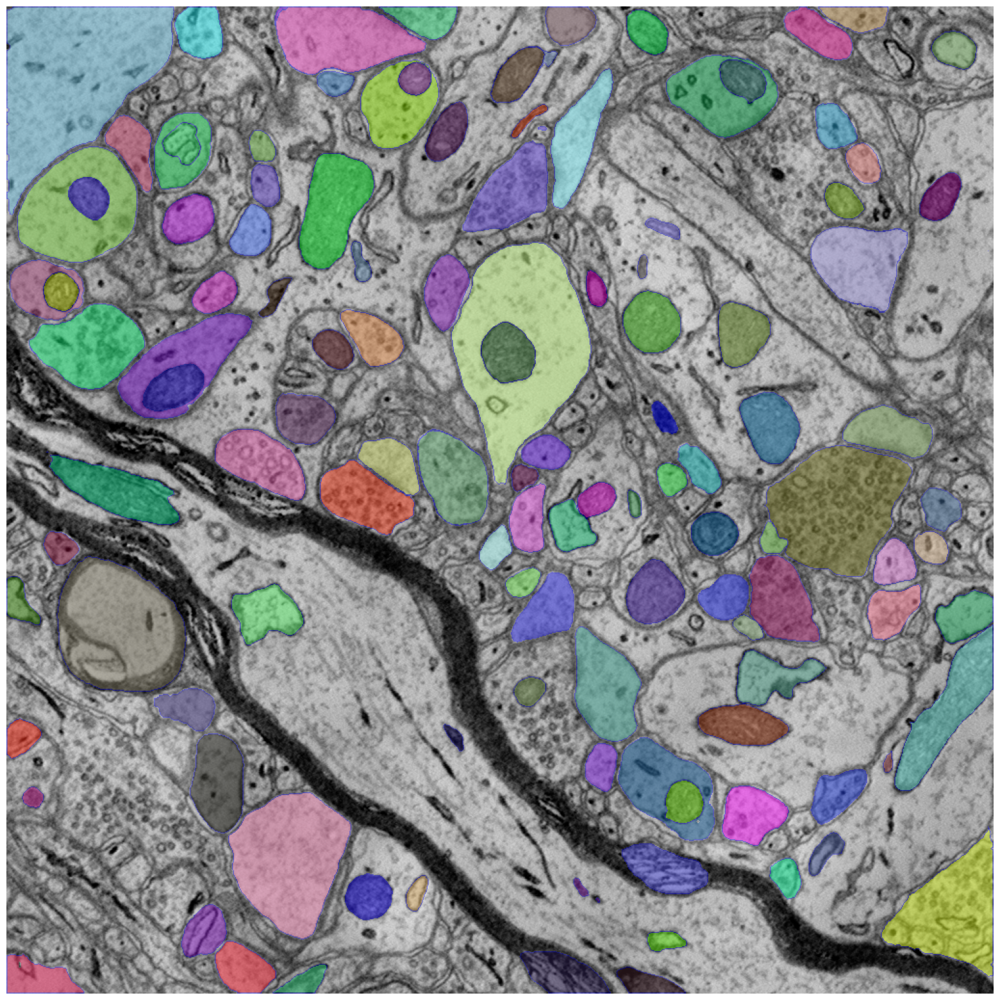

In [ ]:
# - default large model + test image
masks = mask_generator.generate(image)
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 

In [ ]:
# - load finetuned parameter (doubt mask generator doesn't efficiently utilize finetuned predictor)
mask_generator.predictor.model.load_state_dict(torch.load("large_model.torch"))

<All keys matched successfully>

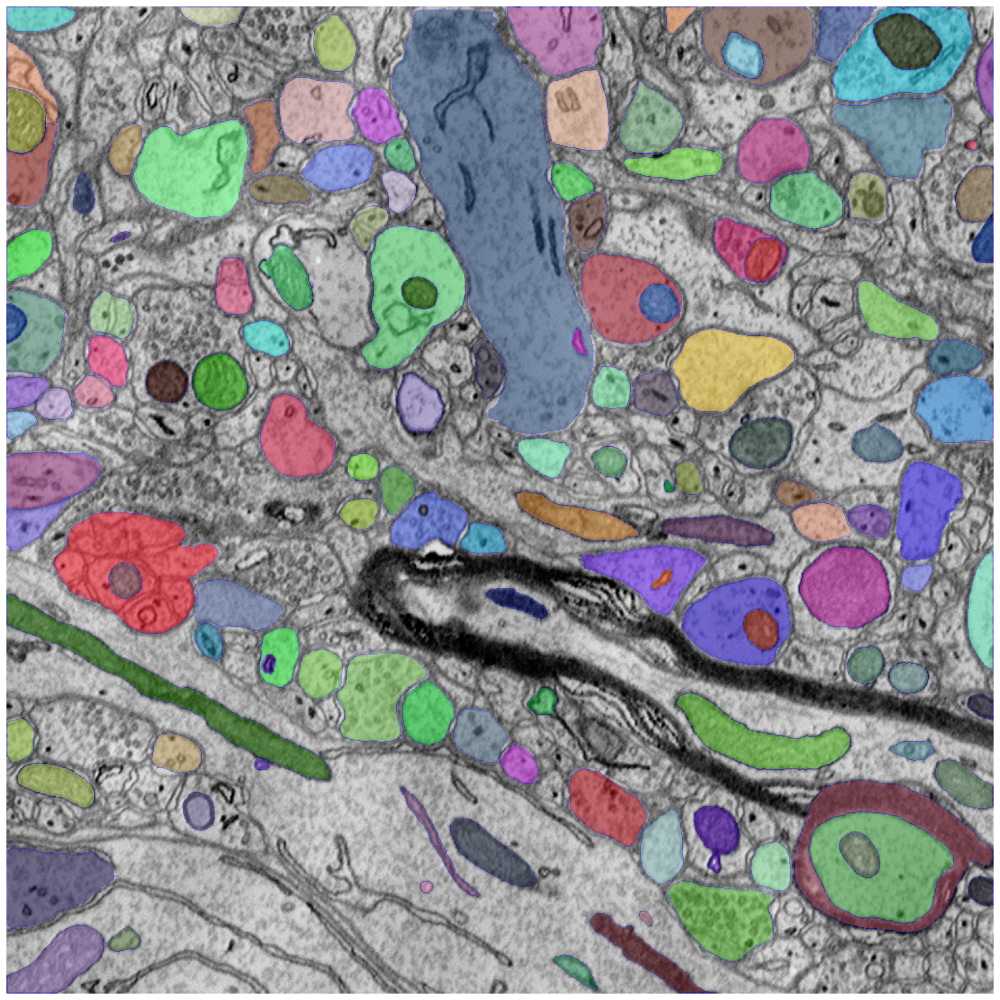

In [ ]:
# - finetued predictor + train image
train_masks = mask_generator.generate(train_image)
plt.figure(figsize=(20, 20))
plt.imshow(train_image)
show_anns(train_masks)
plt.axis('off')
plt.show() 

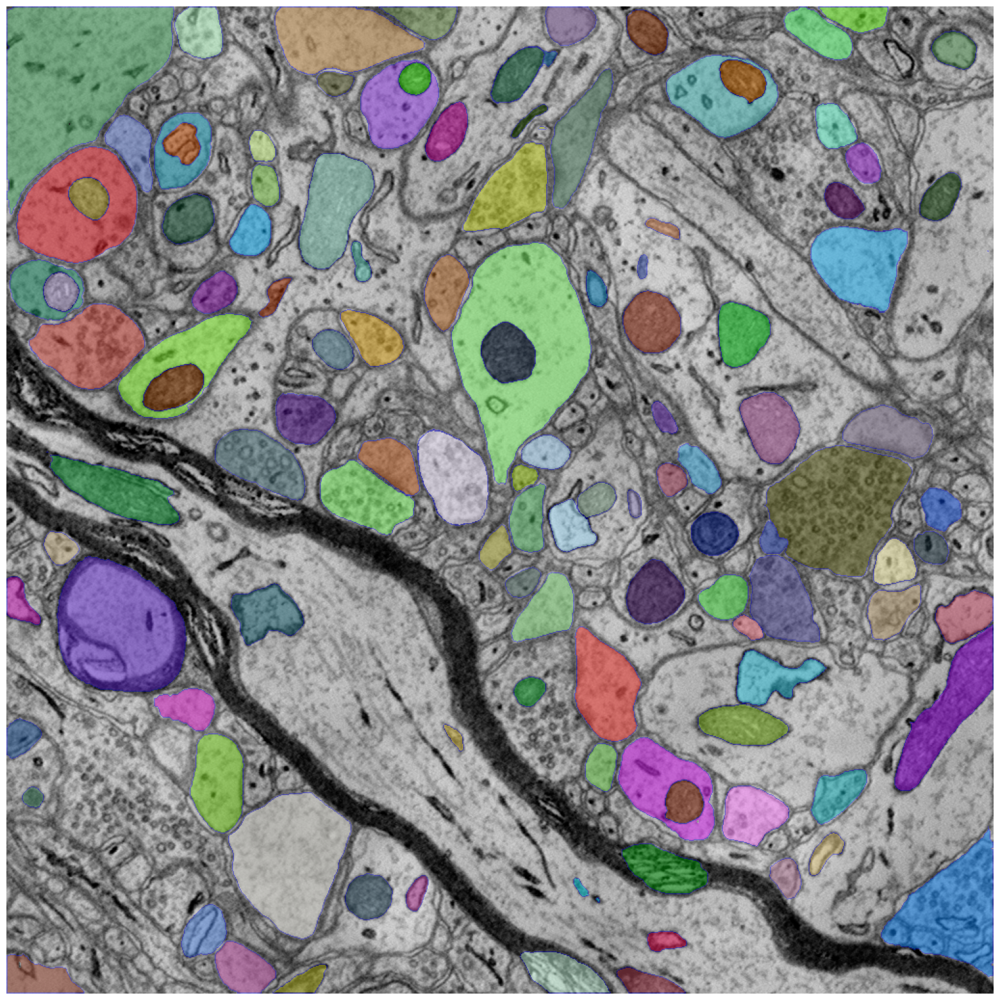

In [ ]:
# - finetunelarge model + test image
masks = mask_generator.generate(image)
plt.figure(figsize=(20, 20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show() 